# Лабораторная работа №3
## Жарова Светлана А-16-22
### Вариант №47 

### Задача 3.1.
Реализовать решение СЛАУ с помощью $LU$ разложения и $LU$ разложения по схеме частичного выбора. Решить систему небольшой размерности с возмущенной матрицей обоими методами, оценить погрешность и сравнить с теоретической оценкой. Проанализировать поведение  методов с ростом числа уравнений

$$ (47 + 4)\text{ mod } 2 = 1 $$ - решение с помощью LU модифицирует исходную матрицу А; решение с помощью LU по схеме частичного выбора реализовано в виде двух функций, одна из которых возвращает две матрицы – L и U, не модифицируя A, а вторая функция решает систему.

$$ (47 + 4)\text{ mod }5 = 1 $$
$$A_{ij} = \frac {1} {70 - 3i - j}
$$ 

In [6]:
import numpy as np
np.isinf
np.isfinite
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator as ML
from numpy.linalg import inv

LU разложение:

In [7]:
n = 5

A = np.array([[1/(70-3*i - j) for j in range(n)] for i in range(n)])
x_N = np.array([47]*n)
b = np.dot(A, x_N)
print(A)
print(b)

[[0.01428571 0.01449275 0.01470588 0.01492537 0.01515152]
 [0.01492537 0.01515152 0.01538462 0.015625   0.01587302]
 [0.015625   0.01587302 0.01612903 0.01639344 0.01666667]
 [0.01639344 0.01666667 0.01694915 0.01724138 0.01754386]
 [0.01724138 0.01754386 0.01785714 0.01818182 0.01851852]]
[3.45737821 3.61709742 3.7922964  3.98534154 4.19910777]


In [8]:
def LU_simple(A, b, n):
    m = np.shape(0)
    for j in range(n - 1):
        for i in range(j + 1, n):
            m = A[i, j] / A[j, j]
            A[i, j::] = A[i, j::] - m*A[j, j::] 
            A[i, j] = m
        #L[j, j] = 1
    #L[n-1, n-1] = 1
    y = np.zeros(n)
    for i in range(0, n):
        y[i] = b[i] - np.sum(A[i, 0:i+1]*y[0:i+1])
    x = np.zeros(n)  
    for i in range(n-1, -1, -1):
        x[i] = y[i] - np.sum(A[i,i+1::]*x[i+1::])
        x[i] /= A[i, i]
    #print('модифицированная матрица А\n', A)
    #print('вектор решение:')
    return x

In [9]:
x = LU_simple(A, b, n)
print(A)
print(x)

[[1.42857143e-02 1.44927536e-02 1.47058824e-02 1.49253731e-02
  1.51515152e-02]
 [1.04477612e+00 9.83226162e-06 2.02606875e-05 3.13265761e-05
  4.30746699e-05]
 [1.09375000e+00 2.19345238e+00 3.25812707e-08 1.02404401e-07
  2.14732358e-07]
 [1.14754098e+00 3.62459016e+00 3.47296471e+00 2.96702068e-10
  1.26614249e-09]
 [1.20689655e+00 5.35027223e+00 8.10163339e+00 4.92002720e+00
  5.96692577e-12]]
[47.0004705  46.99823573 47.00247824 46.99845454 47.000361  ]


2. Реализовать метод решения СЛАУ с помощью LU разложения по схеме частичного выбора в виде, указанном в приложении. Убедиться в его работоспособности.

In [10]:
import numpy as np
from numpy.linalg import inv

def meac(A, n, count):
    max_val = abs(A[count, count])
    k = count
    for i in range(count, n):
        if abs(A[i, count]) > max_val:
            max_val = abs(A[i, count])
            k = i
    return k

def LUP1(A, n):
    L = np.eye(n)
    P = np.eye(n)
    U = np.copy(A)
    for j in range(n - 1):
        k = meac(U, n, j)
        U[[j, k]] = U[[k, j]]
        L[[j, k], :j] = L[[k, j], :j]
        P[[j, k]] = P[[k, j]]
        for i in range(j + 1, n):
            L[i, j] = U[i, j] / U[j, j]
            U[i, j:] -= L[i, j] * U[j, j:]
    return L, U, P

def LUP(A, b):
    n = len(A)
    L, U, P = LUP1(A, n)
    Pb = np.dot(P, b)
    y = np.zeros(n)
    for i in range(n):
        y[i] = Pb[i] - np.dot(L[i, :i], y[:i])
    x = np.zeros(n)
    for i in range(n - 1, -1, -1):
        x[i] = (y[i] - np.dot(U[i, i + 1:], x[i + 1:])) / U[i, i]
    return x

A = np.array([[1/(70 - 3*i - j) for j in range(5)] for i in range(5)])


x = LUP(A, b)
print("Solution:", x)
print(A)
print(b)

Solution: [46.99954006 47.00172627 46.99757284 47.00151509 46.99964573]
[[0.01428571 0.01449275 0.01470588 0.01492537 0.01515152]
 [0.01492537 0.01515152 0.01538462 0.015625   0.01587302]
 [0.015625   0.01587302 0.01612903 0.01639344 0.01666667]
 [0.01639344 0.01666667 0.01694915 0.01724138 0.01754386]
 [0.01724138 0.01754386 0.01785714 0.01818182 0.01851852]]
[3.45737821 3.61709742 3.7922964  3.98534154 4.19910777]


In [11]:
print(LUP1(A, n))

(array([[ 1.        ,  0.        ,  0.        ,  0.        ,  0.        ],
       [ 0.82857143,  1.        ,  0.        ,  0.        ,  0.        ],
       [ 0.90625   ,  0.59895833,  1.        ,  0.        ,  0.        ],
       [ 0.95081967,  0.32991803,  0.86824118,  1.        ,  0.        ],
       [ 0.86567164,  0.81919946,  0.65229099, -0.68084626,  1.        ]]), array([[ 1.72413793e-02,  1.75438596e-02,  1.78571429e-02,
         1.81818182e-02,  1.85185185e-02],
       [ 0.00000000e+00, -4.35872289e-05, -9.00360144e-05,
        -1.39561931e-04, -1.92400192e-04],
       [ 0.00000000e+00, -3.38813179e-21, -7.56350927e-08,
        -2.38322969e-07, -5.01042168e-07],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
        -1.72626642e-10, -7.38583059e-10],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         0.00000000e+00, -8.25719244e-13]]), array([[0., 0., 0., 0., 1.],
       [1., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0.],
       [0., 0., 0., 1., 0.],

3. Решить систему $A^*x = b$, размера $5x5$, двумя методами. Вектор $b$ задается как $b = Ax$, где $x_i = N$, $N$ - номер варианта. Матрицу $A^*_{ij}$ задать как $A_{ij}$ и к одному элементу прибавить $10^{-3}$.

In [12]:
A0 = np.copy(A)
A0[0, 1] = A[0, 1] + 10**(-3)
print(A0)
A1 = np.copy(A0)
b1 = np.copy(b)

[[0.01428571 0.01549275 0.01470588 0.01492537 0.01515152]
 [0.01492537 0.01515152 0.01538462 0.015625   0.01587302]
 [0.015625   0.01587302 0.01612903 0.01639344 0.01666667]
 [0.01639344 0.01666667 0.01694915 0.01724138 0.01754386]
 [0.01724138 0.01754386 0.01785714 0.01818182 0.01851852]]


In [16]:
x0 = LU_simple(A0, b, n)
print(x0)

[ 3.45281002e+00  4.36591538e-03  8.33009681e-03 -9.91515816e-04
  2.24919883e+02]


In [15]:
x = LUP(A0, b)
print(A0)
print()
print("Solution:", x)

[[ 1.42857143e-02  1.54927536e-02  1.47058824e-02  1.49253731e-02
   1.51515152e-02]
 [ 1.04477612e+00 -1.03494386e-03  2.02606875e-05  3.13265761e-05
   4.30746699e-05]
 [ 1.09375000e+00  1.03598219e+00  2.34837232e-05  3.63619825e-05
   5.00723789e-05]
 [ 1.14754098e+00  1.07436076e+00  2.20504025e+00  6.62643297e-08
   1.85703323e-07]
 [ 1.20689655e+00  1.11531777e+00  3.66496615e+00  3.50551940e+00
   6.23542263e-10]]

Solution: [ 3.45281002e+00  4.36591538e-03  8.33009681e-03 -9.91515816e-04
  2.24919883e+02]


Заметим, что найденное значение  не совпадает с исходным. Связано это с тем, что матрица  плохо обусловленна.

4. Вычислить погрешность и сравнить ее с теоретической оценкой. Для вычисления обратной матрицы можно воспользоваться встроенными функциями.

In [17]:
import numpy as np
from scipy import linalg
n = 5

A = np.array([[1/(70-3*i - j) for j in range(n)] for i in range(n)])
x_N = np.array([47]*n)
b = np.dot(A, x_N)
print(A)
print(b)

A0 = np.copy(A)
A0[0, 0] += 10e-3 

x0 = linalg.solve(A0, b)
x1 = LU_simple(A, b, n)
x2 = LUP(A, b)

def dx(x_res, x):
    return linalg.norm(x_res - x, ord=2) / linalg.norm(x, ord=2)

def teor(A_res, A):
    return linalg.norm(A_res - A, ord=2) * np.linalg.cond(A) / linalg.norm(A)

[[0.01428571 0.01449275 0.01470588 0.01492537 0.01515152]
 [0.01492537 0.01515152 0.01538462 0.015625   0.01587302]
 [0.015625   0.01587302 0.01612903 0.01639344 0.01666667]
 [0.01639344 0.01666667 0.01694915 0.01724138 0.01754386]
 [0.01724138 0.01754386 0.01785714 0.01818182 0.01851852]]
[3.45737821 3.61709742 3.7922964  3.98534154 4.19910777]


In [18]:
print('Погрешность решение                              :', dx(x0, x_N))
print('Погрешность решение LU                           :', dx(x1, x_N))
print('Погрешность решение LU по схеме частичного выбора:', dx(x2, x_N))
print('Теоретическая оценка погрешности                 :', teor(A0, A))
print('Число обусловленности матрицы A                  :', np.linalg.cond(A))

Погрешность решение                              : 3.2911686911113236
Погрешность решение LU                           : 3.295393616171722e-05
Погрешность решение LU по схеме частичного выбора: 1.9073179826863467
Теоретическая оценка погрешности                 : 757.0897445928352
Число обусловленности матрицы A                  : 788.3771126376915


5. Задавая вектор $b$ как $b = Ax$, где $x_i = N$, решить систему обоими методам для размера матрицы $n = 5, 6, ... 15$.

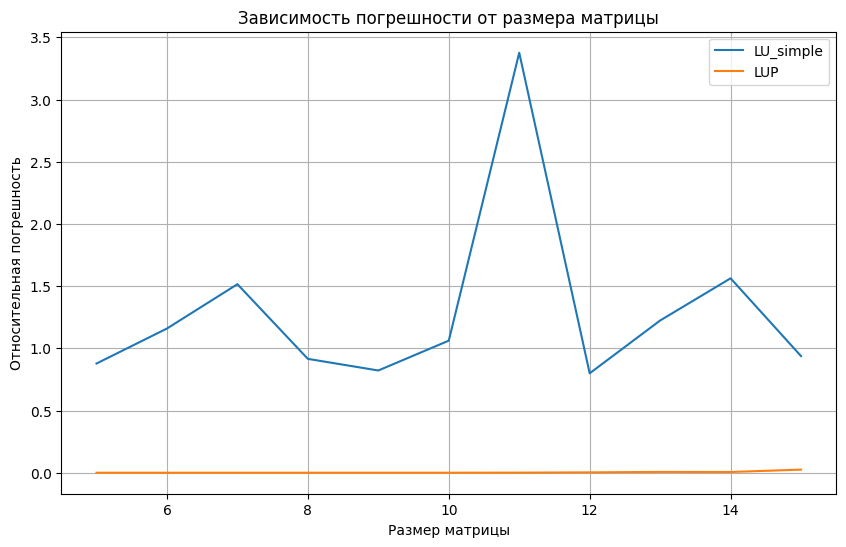

In [28]:
import numpy as np
import matplotlib.pyplot as plt
from numpy.linalg import norm, cond, inv

def relative_error(x_res, x):
    return norm(x_res - x, ord=2) / norm(x, ord=2)

# Размеры матрицы от 5 до 15
sizes = range(5, 16)

# Число для компонент вектора x
N = 10

# Списки для хранения погрешностей
errors_lu_simple = []
errors_lup = []

# Генерация вектора x
x = np.array([N] * 5)

# Вычисление и сохранение погрешностей для каждого размера матрицы
for n in sizes:
    # Генерация матрицы A
    A = np.array([[1/(70 - 3*i - j) for j in range(n)] for i in range(n)])
    A0 = np.array([[1/(70-3*i - j) for j in range(n)] for i in range(n)])
    A0[0][1] = A[0][1] + 10**(-3)
    x = [N for i in range(n)]
    b = np.dot(A, x)
    # Решение системы методом LU_simple
    x_lu_simple = LU_simple(A, b, n)
    x_lu_simple1 = LU_simple(A0, b, n)    
    # Решение системы методом LUP
    x_lup = LUP(A, b)
    x_lup1 = LUP(A0, b)
    # Вычисление погрешностей
    error_lu_simple = relative_error(x_lu_simple1, x_lu_simple)
    error_lup = relative_error(x_lup1, x_lup)
    # Добавление погрешностей в списки
    errors_lu_simple.append(error_lu_simple)
    errors_lup.append(error_lup)

# Построение графика
plt.figure(figsize=(10, 6))
plt.plot(sizes, errors_lu_simple, label='LU_simple')
plt.plot(sizes, errors_lup, label='LUP')
plt.xlabel('Размер матрицы')
plt.ylabel('Относительная погрешность')
plt.title('Зависимость погрешности от размера матрицы')
plt.legend()
plt.grid(True)
plt.show()

Большое значение погрешности в LU разложении можно объяснить тем, что матрица A плохо обусловлена, в следствие чего производится большее число операций, и полученные значения будут все больше и больше отличаться от точного решения.

### 3.2. 
Дана  разреженная  матрица A. Найти число обусловленности матрицы.


1) Задание матрицы А и вектора b

In [2]:
import numpy as np

# Значение N
N = 47
m = 20
D = N * m + m/N
# Создание матрицы A с помощью списка списков
A = np.array([
    [D, N, N, N, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [N, D, N, N, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [N, N, D, N, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [N, N, N, D, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [N, N, N, N, D, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [N, N, N, N, 0, D, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [N, N, N, N, 0, 0, D, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [N, N, N, N, 0, 0, 0, D, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, N, N, N, N, D, N, N, N, N, N, N, N, N, N, N, N],
    [0, 0, 0, 0, N, N, N, N, 0, D, N, N, N, N, N, N, N, N, N, N],
    [0, 0, 0, 0, N, N, N, N, 0, 0, D, N, N, N, N, N, N, N, N, N],
    [0, 0, 0, 0, N, N, N, N, 0, 0, 0, D, N, N, N, N, N, N, N, N],
    [0, 0, 0, 0, N, N, N, N, 0, 0, 0, 0, D, N, N, N, N, N, N, N],
    [0, 0, 0, 0, N, N, N, N, 0, 0, 0, 0, 0, D, N, N, N, N, N, N],
    [N, N, N, N, N, N, N, N, 0, 0, 0, 0, 0, 0, D, N, N, N, N, N],
    [N, N, N, N, N, N, N, N, 0, 0, 0, 0, 0, 0, 0, D, N, N, N, N],
    [N, N, N, N, N, N, N, N, 0, 0, 0, 0, 0, 0, 0, 0, D, N, N, N],
    [N, N, N, N, N, N, N, N, 0, 0, 0, 0, 0, 0, 0, 0, 0, D, N, N],
    [N, N, N, N, N, N, N, N, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, D, N],
    [N, N, N, N, N, N, N, N, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, D]
])

x_N = np.array([47]*n)
b = np.dot(A, x_N)
print(A)
print(b)

[[940.42553191  47.          47.          47.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.        ]
 [ 47.         940.42553191  47.          47.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.        ]
 [ 47.          47.         940.42553191  47.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.        ]
 [ 47.          47.          47.         940.42553191   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.        ]
 [ 47.          47. 

2) Разработать  и реализовать алгоритм решения системы с данной матрицей А  прямым методом  с учетом нулевых элементов. Произвести тестирование программы. 
Я выбрала метод Гаусса:

In [3]:
import numpy as np

def gauss_elimination(A, b):
    n = len(b)
    # Прямой ход метода Гаусса
    for i in range(n):
        # Пропускаем нулевые элементы
        if A[i][i] == 0:
            continue
        
        for j in range(i+1, n):
            ratio = A[j][i] / A[i][i]
            # Пропускаем нулевые элементы
            if ratio == 0:
                continue
            
            for k in range(i, n):
                A[j][k] -= ratio * A[i][k]
            b[j] -= ratio * b[i]
    
    # Обратный ход метода Гаусса
    x = np.zeros(n)
    for i in range(n-1, -1, -1):
        # Пропускаем нулевые элементы
        if A[i][i] == 0:
            continue
        
        x[i] = b[i] / A[i][i]
        for j in range(i-1, -1, -1):
            # Пропускаем нулевые элементы
            if A[j][i] == 0:
                continue
            b[j] -= A[j][i] * x[i]
            A[j][i] = 0  # Обнуляем элементы, чтобы избежать вычислений над ними в дальнейших итерациях
    
    return x
    
solution = gauss_elimination(A, b)
print("Решение:", solution)


Решение: [47. 47. 47. 47. 47. 47. 47. 47. 47. 47. 47. 47. 47. 47. 47. 47. 47. 47.
 47. 47.]


#### 3. Найти обратную матрицу
У меня не получилось найти ее ни встроенным методом, ни методом Гаусса так как матрица невырожденная и определитель равен 0. Пришлось использовать псевдообратную матрицу и встроенную функцию.

In [4]:
import numpy as np

pseudo_inverse_A = np.linalg.pinv(A)
print("Pseudo-inverse matrix A:")
print(pseudo_inverse_A)

Pseudo-inverse matrix A:
[[0.00106335 0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.        ]
 [0.         0.00106601 0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.        ]
 [0.         0.         0.00106843 0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.        ]
 [0.         0.         0.         0.00107064 0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.        ]
 [0.         0.         0.         0.         0.00106335 0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         

#### 4. Найти число обусловленности матрицы, используя обратную матрицу  

In [5]:
def matrix_condition_number(A):
    norm_A = np.linalg.norm(A)
    norm_inverse_A = np.linalg.norm(pseudo_inverse_A)
    condition_number = norm_A * norm_inverse_A
    return condition_number

# Пример
condition_number = matrix_condition_number(A)

print("Число обусловленности матрицы A:", condition_number)


Число обусловленности матрицы A: 20.000131551853702


#### 5. Ответить на вопросы: 1. Является ли матрица хорошо обусловленной? 2. Какова трудоемкость полученного метода? 

1. Да, так как condA < 100
2. 244

### 3.3 Дана система уравнений с  матрицей системы A из задачи  3.2  и вектором b. Решить  систему уравнений методом Якоби с точностью $10^{-10}$. 


In [1]:
import numpy as np

N = 47
m = 20
D = N * m + m/N
# Создание матрицы A с помощью списка списков
A = np.array([
    [D, N, N, N, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [N, D, N, N, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [N, N, D, N, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [N, N, N, D, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [N, N, N, N, D, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [N, N, N, N, 0, D, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [N, N, N, N, 0, 0, D, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [N, N, N, N, 0, 0, 0, D, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, N, N, N, N, D, N, N, N, N, N, N, N, N, N, N, N],
    [0, 0, 0, 0, N, N, N, N, 0, D, N, N, N, N, N, N, N, N, N, N],
    [0, 0, 0, 0, N, N, N, N, 0, 0, D, N, N, N, N, N, N, N, N, N],
    [0, 0, 0, 0, N, N, N, N, 0, 0, 0, D, N, N, N, N, N, N, N, N],
    [0, 0, 0, 0, N, N, N, N, 0, 0, 0, 0, D, N, N, N, N, N, N, N],
    [0, 0, 0, 0, N, N, N, N, 0, 0, 0, 0, 0, D, N, N, N, N, N, N],
    [N, N, N, N, N, N, N, N, 0, 0, 0, 0, 0, 0, D, N, N, N, N, N],
    [N, N, N, N, N, N, N, N, 0, 0, 0, 0, 0, 0, 0, D, N, N, N, N],
    [N, N, N, N, N, N, N, N, 0, 0, 0, 0, 0, 0, 0, 0, D, N, N, N],
    [N, N, N, N, N, N, N, N, 0, 0, 0, 0, 0, 0, 0, 0, 0, D, N, N],
    [N, N, N, N, N, N, N, N, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, D, N],
    [N, N, N, N, N, N, N, N, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, D]
])

b = np.array([(abs(N - 25) + 5) * i * N for i in range(1, 21)])

print("Матрица A:")
print(A)
print("\nВектор b:")
print(b)


Матрица A:
[[940.42553191  47.          47.          47.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.        ]
 [ 47.         940.42553191  47.          47.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.        ]
 [ 47.          47.         940.42553191  47.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.        ]
 [ 47.          47.          47.         940.42553191   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.           0.        ]
 [ 47.   

#### 2. Преобразование системы к виду, удобному для итераций метода Якоби.

In [2]:
# Найдем диагональные элементы матрицы A
diagonal_elements = np.diag(A)

# Создадим диагональную матрицу D
D = np.diag(diagonal_elements)

# Вычислим матрицу B и вектор c
B = np.eye(len(A)) - np.linalg.inv(D) @ A
c = np.linalg.inv(D) @ b

print("Матрица B:")
print(B)
print("\nВектор c:")
print(c)


Матрица B:
[[ 1.11022302e-16 -4.99773756e-02 -4.99773756e-02 -4.99773756e-02
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [-4.99773756e-02  1.11022302e-16 -4.99773756e-02 -4.99773756e-02
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [-4.99773756e-02 -4.99773756e-02  1.11022302e-16 -4.99773756e-02
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+

In [3]:
B = np.empty_like(A) 
for i in range(20):
    for j in range(20): 
        if i == j:
            B[i][j] = 0 
        else:
            B[i][j] = -A[i][j] / A[i][i] 
c = np.empty_like(b)
for i in range(20):
    c[i] = b[i] / A[i][i]
print(f"Норма итерационной матрицы: {np.linalg.cond(B)}")

Норма итерационной матрицы: 1.0743658653319717e+18


In [4]:
spectral_radius = np.max(np.abs(np.linalg.eigvals(A)))

# Проверяем достаточное условие сходимости
if spectral_radius < 1:
    print("Достаточное условие сходимости метода Якоби выполняется.")
else:
    print("Достаточное условие сходимости метода Якоби НЕ выполняется.")

Достаточное условие сходимости метода Якоби НЕ выполняется.


Реализуем метод Якоби, проверяя условие сходимости. Находим решение с заданной точностью.

Метод Якоби является итерационным методом, который может потребовать большого числа итераций для достижения заданной точности, особенно в случае, когда матрица системы плохо обусловлена или имеет большие значения элементов. Это приводит к большим значениям вектора 
x. А в нашем случае большие значения вектора b являются естественным следствием постановки задачи.

In [ ]:
import numpy as np

def gauss_seidel_method(A, b, x0, max_iter=1000, tol=1e-10):
    """
    Метод Гаусса-Зейделя для решения системы линейных уравнений Ax=b.
    
    Параметры:
        A (array): Матрица коэффициентов.
        b (array): Вектор правой части.
        x0 (array): Начальное приближение.
        max_iter (int): Максимальное количество итераций.
        tol (float): Точность, при достижении которой алгоритм останавливается.
        
    Возвращает:
        x (array): Решение системы уравнений.
        residuals (list): Список значений нормы вектора невязки на каждой итерации.
        iterations (int): Количество итераций, потребовавшихся для сходимости.
    """
    x = np.array(x0)
    residuals = []
    iterations = 0
    n = len(b)
    for k in range(max_iter):
        x_new = np.empty_like(x)
        for i in range(n):
            x_new[i] = (b[i] - np.dot(A[i, :i], x_new[:i]) - np.dot(A[i, i + 1:], x[i + 1:])) / A[i, i]
        
        residual = b - A @ x_new
        residual_norm = np.linalg.norm(residual)
        residuals.append(residual_norm)
        
        if residual_norm < tol:
            break
        
        x = x_new
        iterations += 1
    
    return x, residuals, iterations

x0 = np.zeros_like(b)

# Вызываем метод Гаусса-Зейделя
solution, residuals, iterations = gauss_seidel_method(A, b, x0, tol=1e-10)

# Выводим результаты
print("Решение методом Гаусса-Зейделя:", solution)
print("Количество итераций:", iterations)
print("Норма вектора невязки на каждой итерации:", residuals)


In [ ]:
eps = 1e-10
xn = np.array(b)
xn1 = np.array(xn)
iters = 0
while True:
    r0 = A @ xn - b
    iters += 1
    rn = A @ xn1 - b
    if np.linalg.norm(rn) < eps:
        break
    xn = xn1
    xn1 = B @ xn + c

print(f"Количество итераций: {iters}")
print("Ответ:", xn1)


In [ ]:
svet1ana2004@icloud.com

In [ ]:
eps = 1e-10

xn = np.array(b)
xn1 = np.array(xn)
r0 = A @ xn - b 
rn = np.array(r0)
iters = 1
print(f"Итерация: {iters}\tНорма невязки: {np.linalg.norm(rn)}") 
while (np.linalg.norm(r0)/np.linalg.norm(rn) < 1/eps):
    iters += 1
    xn = xn1
    xn1 = B@xn + c
    rn = A @ xn - b
    print(f"Итерация: {iters}\tНорма невязки: {np.linalg.norm(rn)}")
print("Ответ:", xn1)

Итерация: 1	Норма невязки: 87312941.0876169
Итерация: 2	Норма невязки: 87312941.0876169
Итерация: 3	Норма невязки: 34158359.23821509
Итерация: 4	Норма невязки: 8470830.172066694
Итерация: 5	Норма невязки: 1519266.233478519
Итерация: 6	Норма невязки: 222026.89916345009
Итерация: 7	Норма невязки: 31614.666921950466
Итерация: 8	Норма невязки: 3814.441547643052
Итерация: 9	Норма невязки: 2825.475801794635
Итерация: 10	Норма невязки: 2452.3555524681938
Итерация: 11	Норма невязки: 2499.109065067798
Итерация: 12	Норма невязки: 2491.8837600429365
Итерация: 13	Норма невязки: 2492.9620965280174
Итерация: 14	Норма невязки: 2492.800310954884
Итерация: 15	Норма невязки: 2492.824565339243
Итерация: 16	Норма невязки: 2492.8209287725085
Итерация: 17	Норма невязки: 2492.821474009448
Итерация: 18	Норма невязки: 2492.8213922608825
Итерация: 19	Норма невязки: 2492.8214045176164
Итерация: 20	Норма невязки: 2492.8214026799424
Итерация: 21	Норма невязки: 2492.8214029554692
Итерация: 22	Норма невязки: 2492.82

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



Итерация: 149573	Норма невязки: 2492.8214029195437
Итерация: 149574	Норма невязки: 2492.8214029195437
Итерация: 149575	Норма невязки: 2492.8214029195437
Итерация: 149576	Норма невязки: 2492.8214029195437
Итерация: 149577	Норма невязки: 2492.8214029195437
Итерация: 149578	Норма невязки: 2492.8214029195437
Итерация: 149579	Норма невязки: 2492.8214029195437
Итерация: 149580	Норма невязки: 2492.8214029195437
Итерация: 149581	Норма невязки: 2492.8214029195437
Итерация: 149582	Норма невязки: 2492.8214029195437
Итерация: 149583	Норма невязки: 2492.8214029195437
Итерация: 149584	Норма невязки: 2492.8214029195437
Итерация: 149585	Норма невязки: 2492.8214029195437
Итерация: 149586	Норма невязки: 2492.8214029195437
Итерация: 149587	Норма невязки: 2492.8214029195437
Итерация: 149588	Норма невязки: 2492.8214029195437
Итерация: 149589	Норма невязки: 2492.8214029195437
Итерация: 149590	Норма невязки: 2492.8214029195437
Итерация: 149591	Норма невязки: 2492.8214029195437
Итерация: 149592	Норма невязки:

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



Итерация: 290797	Норма невязки: 2492.8214029195437
Итерация: 290798	Норма невязки: 2492.8214029195437
Итерация: 290799	Норма невязки: 2492.8214029195437
Итерация: 290800	Норма невязки: 2492.8214029195437
Итерация: 290801	Норма невязки: 2492.8214029195437
Итерация: 290802	Норма невязки: 2492.8214029195437
Итерация: 290803	Норма невязки: 2492.8214029195437
Итерация: 290804	Норма невязки: 2492.8214029195437
Итерация: 290805	Норма невязки: 2492.8214029195437
Итерация: 290806	Норма невязки: 2492.8214029195437
Итерация: 290807	Норма невязки: 2492.8214029195437
Итерация: 290808	Норма невязки: 2492.8214029195437
Итерация: 290809	Норма невязки: 2492.8214029195437
Итерация: 290810	Норма невязки: 2492.8214029195437
Итерация: 290811	Норма невязки: 2492.8214029195437
Итерация: 290812	Норма невязки: 2492.8214029195437
Итерация: 290813	Норма невязки: 2492.8214029195437
Итерация: 290814	Норма невязки: 2492.8214029195437
Итерация: 290815	Норма невязки: 2492.8214029195437
Итерация: 290816	Норма невязки:

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



Итерация: 434009	Норма невязки: 2492.8214029195437
Итерация: 434010	Норма невязки: 2492.8214029195437
Итерация: 434011	Норма невязки: 2492.8214029195437
Итерация: 434012	Норма невязки: 2492.8214029195437
Итерация: 434013	Норма невязки: 2492.8214029195437
Итерация: 434014	Норма невязки: 2492.8214029195437
Итерация: 434015	Норма невязки: 2492.8214029195437
Итерация: 434016	Норма невязки: 2492.8214029195437
Итерация: 434017	Норма невязки: 2492.8214029195437
Итерация: 434018	Норма невязки: 2492.8214029195437
Итерация: 434019	Норма невязки: 2492.8214029195437
Итерация: 434020	Норма невязки: 2492.8214029195437
Итерация: 434021	Норма невязки: 2492.8214029195437
Итерация: 434022	Норма невязки: 2492.8214029195437
Итерация: 434023	Норма невязки: 2492.8214029195437
Итерация: 434024	Норма невязки: 2492.8214029195437
Итерация: 434025	Норма невязки: 2492.8214029195437
Итерация: 434026	Норма невязки: 2492.8214029195437
Итерация: 434027	Норма невязки: 2492.8214029195437
Итерация: 434028	Норма невязки:

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



Итерация: 582427	Норма невязки: 2492.8214029195437
Итерация: 582428	Норма невязки: 2492.8214029195437
Итерация: 582429	Норма невязки: 2492.8214029195437
Итерация: 582430	Норма невязки: 2492.8214029195437
Итерация: 582431	Норма невязки: 2492.8214029195437
Итерация: 582432	Норма невязки: 2492.8214029195437
Итерация: 582433	Норма невязки: 2492.8214029195437
Итерация: 582434	Норма невязки: 2492.8214029195437
Итерация: 582435	Норма невязки: 2492.8214029195437
Итерация: 582436	Норма невязки: 2492.8214029195437
Итерация: 582437	Норма невязки: 2492.8214029195437
Итерация: 582438	Норма невязки: 2492.8214029195437
Итерация: 582439	Норма невязки: 2492.8214029195437
Итерация: 582440	Норма невязки: 2492.8214029195437
Итерация: 582441	Норма невязки: 2492.8214029195437
Итерация: 582442	Норма невязки: 2492.8214029195437
Итерация: 582443	Норма невязки: 2492.8214029195437
Итерация: 582444	Норма невязки: 2492.8214029195437
Итерация: 582445	Норма невязки: 2492.8214029195437
Итерация: 582446	Норма невязки:

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



Итерация: 724218	Норма невязки: 2492.8214029195437
Итерация: 724219	Норма невязки: 2492.8214029195437
Итерация: 724220	Норма невязки: 2492.8214029195437
Итерация: 724221	Норма невязки: 2492.8214029195437
Итерация: 724222	Норма невязки: 2492.8214029195437
Итерация: 724223	Норма невязки: 2492.8214029195437
Итерация: 724224	Норма невязки: 2492.8214029195437
Итерация: 724225	Норма невязки: 2492.8214029195437
Итерация: 724226	Норма невязки: 2492.8214029195437
Итерация: 724227	Норма невязки: 2492.8214029195437
Итерация: 724228	Норма невязки: 2492.8214029195437
Итерация: 724229	Норма невязки: 2492.8214029195437
Итерация: 724230	Норма невязки: 2492.8214029195437
Итерация: 724231	Норма невязки: 2492.8214029195437
Итерация: 724232	Норма невязки: 2492.8214029195437
Итерация: 724233	Норма невязки: 2492.8214029195437
Итерация: 724234	Норма невязки: 2492.8214029195437
Итерация: 724235	Норма невязки: 2492.8214029195437
Итерация: 724236	Норма невязки: 2492.8214029195437
Итерация: 724237	Норма невязки: